<pre><h1>E1-313 TIPR Assignment 3 Code base & Report</h1>
<h2>Convolutional Neural Network Implementation in Python3</h2>
<h3><i> - Achint Chaudhary</i></h3>
<h3>15879, M.Tech (CSA)</h3>
<h5>Note:</h5> Please Scroll Down for Report section, or search "Experimentation Section"

In [0]:
import os,sys,shutil,datetime,pickle,codecs,tempfile,gzip

import numpy as np
import scipy as sp
import pandas as pd
import cv2

import matplotlib as mpl
import matplotlib.pyplot as plt
import sklearn, skimage
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.metrics import accuracy_score, f1_score

from IPython.display import Image, display

In [2]:
!pip install opentsne

    100% |████████████████████████████████| 829kB 18.1MB/s 
  Stored in directory: /root/.cache/pip/wheels/b6/31/84/f319ff8d65c7f2318386c4f878bd8e764fbd4609b5f3350dd8
Successfully built opentsne


In [3]:
import tensorflow.keras
from tensorflow.keras import regularizers
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential,load_model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, BatchNormalization
from tensorflow.keras.layers import Conv2D, MaxPooling2D

import keras

from openTSNE import TSNE

Using TensorFlow backend.


In [0]:
%matplotlib inline
mpl.rcParams['figure.dpi'] = 200
mpl.style.use('default')

In [5]:
# Using GDrive storage as file-system for experimentation
from google.colab import drive
try:
  drive.mount('/content/gdrive')
  os.chdir('gdrive/My Drive/ACHINT/TIPR/tipr-third-assignment-master')
except:
  pass
os.getcwd()

# Removing Permission if you want to unmount
# https://myaccount.google.com/permissions

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


'/content/gdrive/My Drive/ACHINT/TIPR/tipr-third-assignment-master'

In [6]:
# Memory footprint support libraries/code
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil psutil humanize
import psutil, humanize, GPUtil, os

def printC():
  GPUs = GPUtil.getGPUs()
  # WARING: only one GPU on Colab and isn’t guaranteed
  gpu = GPUs[0]
  process = psutil.Process(os.getpid())
  print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
  print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))

printC()

  Stored in directory: /root/.cache/pip/wheels/3d/77/07/80562de4bb0786e5ea186911a2c831fdd0018bda69beab71fd
Successfully built gputil
Gen RAM Free: 12.8 GB  | Proc size: 407.6 MB
GPU RAM Free: 11441MB | Used: 0MB | Util   0% | Total 11441MB


In [7]:
!nvidia-smi

Sat Mar 30 16:29:02 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 410.79       Driver Version: 410.79       CUDA Version: 10.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P8    28W / 149W |      0MiB / 11441MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [0]:
def unpickle(file,is_bytes=True):
  with open(file, 'rb') as fp:
    dict = pickle.load(fp, encoding='bytes')
  return dict
    
def load_mnist(path, kind='train'):
  'Load MNIST data from `path'
  labels_path = os.path.join(path, '%s-labels-idx1-ubyte.gz' % kind)
  images_path = os.path.join(path, '%s-images-idx3-ubyte.gz' % kind)

  with gzip.open(labels_path, 'rb') as lbpath:
    labels = np.frombuffer(lbpath.read(), dtype=np.uint8, offset=8)

  with gzip.open(images_path, 'rb') as imgpath:
    images = np.frombuffer(imgpath.read(), dtype=np.uint8, offset=16).reshape(len(labels), 784)

  return images, labels

In [0]:
try:
  datasets
except:
  datasets = {}
else:
  pass

In [0]:
data_path = 'data/CIFAR-10'
X,Y,target_names = None, None, None
for file_name in os.listdir(data_path):
  if 'data_batch' in file_name:
    temp = unpickle( os.path.join(data_path,file_name) )
    X = pd.concat( (pd.DataFrame(temp[b'data']),  X) ) if X is not None else pd.DataFrame( temp[b'data']   )
    Y = pd.concat( (pd.DataFrame(temp[b'labels']),Y) ) if Y is not None else pd.DataFrame( temp[b'labels'] )
  elif 'batches' in file_name:
    temp = unpickle( '/'.join((data_path,file_name)) )
    target_names = temp[b'label_names']

#X.to_csv( '/'.join((data_path,'X.csv')), header=False,index=False )
#Y.to_csv( '/'.join((data_path,'Y.csv')), header=False,index=False )

X = np.array( [np.array(x).reshape((32,32,3)) for i,x in X.iterrows()] )
Y = np.array( Y )

datasets['CIFAR-10'] = (X,Y,[x.decode('ascii') for x in target_names])

In [0]:
data_path = 'data/Fashion-MNIST'
X, Y = map(pd.DataFrame,load_mnist(data_path, kind='train'))
X = np.array( [np.array([np.array(x).reshape((28,28)),np.array(x).reshape((28,28)),np.array(x).reshape((28,28))]) for i,x in X.iterrows()] )
Y = np.array( Y )
datasets['Fashion-MNIST'] = (np.array([np.array(x).reshape((28,28,3)) for x in X]), np.array(Y), ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot'])

In [12]:
datasets['CIFAR-10'][0].shape, datasets['CIFAR-10'][1].shape, datasets['CIFAR-10'][2]

((50000, 32, 32, 3),
 (50000, 1),
 ['airplane',
  'automobile',
  'bird',
  'cat',
  'deer',
  'dog',
  'frog',
  'horse',
  'ship',
  'truck'])

In [13]:
datasets['Fashion-MNIST'][0].shape, datasets['Fashion-MNIST'][1].shape, datasets['Fashion-MNIST'][2]

((60000, 28, 28, 3),
 (60000, 1),
 ['T-shirt/top',
  'Trouser',
  'Pullover',
  'Dress',
  'Coat',
  'Sandal',
  'Shirt',
  'Sneaker',
  'Bag',
  'Ankle boot'])

In [0]:
# Ref: https://stackoverflow.com/questions/43915482/how-do-you-create-a-custom-activation-function-with-keras
from tensorflow.keras.utils import get_custom_objects

def swish2(x):
  return x*K.sigmoid(x)

def addswish():
  get_custom_objects().update({'swish': Activation(swish2)})

In [0]:
def one_hot(y):
    return 1*(y==y.max(axis=1,keepdims=True))

def get_metrices(y_act,y_pred):
  if len(y_pred.shape)==2:
    y_pred = np.argmax( one_hot(y_pred), axis=1 )
  elif len(y_pred.shape)==1:
    y_pred = np.round(y_pred)
  else:
    raise Exception('Multi dimensional labels')
  y_act = np.argmax( y_act, axis=1 ) if len(y_act.shape)==2 else y_act
  return accuracy_score(y_act,y_pred), f1_score(y_act,y_pred,average='macro'), f1_score(y_act,y_pred,average='micro')
  

def SSplit(X,Y,K=10,seed=True):
    'Stratified Split Function'
    if seed:
        np.random.seed(42)
    Y = pd.DataFrame([tuple(y) for y in Y])
    classes = set(Y)
    c2i = {}
    for index,label in Y.iterrows():
        label = label[0]
        if label in c2i:
            c2i[label].add(index)
        else:
            c2i[label] = {index}
    
    # Each class -> list of indices
    for i in c2i:
        c2i[i] = list(c2i[i])
        np.random.shuffle(c2i[i])
    
    # Each class with its set of train, test split indices
    c2is = {}
    for cls in c2i:
        a = int(np.round(len(c2i[cls])/K))
        c2is[cls] = []
        for fold in range(K):
            test_indices  = c2i[cls][a*fold:a*(fold+1)]
            train_indices = c2i[cls][0:a*fold] + c2i[cls][a*(fold+1):]
            c2is[cls].append((train_indices,test_indices))
        np.random.shuffle(c2is[cls])
        
    index_set = []
    for i in range(K):
        train,test = set(),set()
        for cls in c2is:
            _ = c2is[cls][i]
            train.update(set(_[0]))
            test.update (set(_[1]))
        index_set.append((list(train),list(test)))
    return index_set

In [0]:
class CNN:
  def __init__(self,name='dataset_name', init_method='glorot_normal'):
    self.name = name
    self.model = Sequential()
    self.init_method = init_method
    addswish()
  
  def data_feed( self, M, L, targets):
    self.raw, self.labels, self.target_names = M, L, targets

  def data_validate( self, M=np.array([]), L=np.array([]) ):
    self.vraw, self.vlabels = M, L    

  def data_preprocess(self,mode='scale'):
    sp = np.nan_to_num
    self.preprocess_mode = mode
    if mode=='scale':
      try:
        self.mn, self.mx
      except:
        self.mn, self.mx = self.raw.min(axis=0), self.raw.max(axis=0)
      mx = np.where(self.mx==self.mn,self.mx+1,self.mx)
      self.data  = sp((self.raw - self.mn)/(mx-self.mn))
      try: # If validation data is defined
        self.vdata = sp((self.vraw - self.mn)/(self.mx-self.mn))
      except:
        self.vdata = self.data
    elif mode=='standard':
      try:
        self.mean, self.std
      except:
        self.mean, self.std   = self.raw.mean(axis=0), self.raw.std(axis=0)
      std = np.where(self.std==0,1,self.std)
      self.data = sp((self.raw-self.mean)/std)
      try: # If validation data is defined
        self.vdata  =  sp((self.vraw-self.mean)/std)
      except:
        self.vdata = self.data
    else:
      raise Exception('Code should be unreachable')
    self.data, self.vdata = self.data.astype('float32'), self.vdata.astype('float32')
    try:
      self.vlabels
    except:
      self.vlabels = self.labels

  def add_CONVs(self,FN=[10,], KS =[(3,3),], KSS = [(1,1),], PAD=['same',], ACT=['relu',], PS=[(2,2),], PSS=[(1,1),], BN = [True,], DROP=[0.5,]):
    for i in range(len(ACT)):
      if i==0:
        self.model.add( Conv2D(filters=FN[i], kernel_size=KS[i], strides=KSS[i], padding=PAD[i],kernel_initializer = self.init_method,
                             bias_initializer = self.init_method, input_shape=self.data.shape[1:]) )
      else:
        self.model.add( Conv2D(filters=FN[i], kernel_size=KS[i], strides=KSS[i], padding=PAD[i],kernel_initializer = self.init_method,
                             bias_initializer = self.init_method) )
      self.model.add( Activation(ACT[i]) )
      if BN[i]:
        self.model.add( BatchNormalization() )
      if PS[i]!=(1,1):
        self.model.add( MaxPooling2D(pool_size=PS[i],strides=PSS[i],data_format='channels_last') )
      if DROP[i]:
        self.model.add( Dropout(rate=DROP[i]) )

  def add_FCs(self,UN=[10,], ACT=['relu',], BN = [True,], DROP=[0.5,]):
    self.model.add(Flatten())
    for i in range(len(ACT)):
      if not any(('Conv' in str(x)) for x in self.model.layers):
        if i==0:
          self.model.add( Dense(units=UN[i], kernel_initializer = self.init_method, bias_initializer = self.init_method), input_shape=int(round(np.exp(np.sum(np.log(self.data.shape[1:]))))) )
        else:
          self.model.add( Dense(units=UN[i], kernel_initializer = self.init_method, bias_initializer = self.init_method) )
      if BN[i]:
        self.model.add( BatchNormalization() )
      self.model.add( Activation(ACT[i]) )
      if DROP[i]:
        self.model.add( Dropout(rate=DROP[i]) )
    self.model.add(Dense( len(self.target_names) ))
    self.model.add(Activation('softmax'))

  def optimizer(self,name='Adam',rate=0.001,decay=1e-6):
    if name=='Adam':
      exec( 'self.opt = tensorflow.keras.optimizers.{}(lr={},decay={})'.format(name,rate,decay) )
    elif name=='Nadam':
      exec( 'self.opt = tensorflow.keras.optimizers.{}(lr={},schedule_decay={})'.format(name,rate,decay) )
    

  def compile(self,loss='categorical_crossentropy'):
    self.model.compile(loss=loss, optimizer=self.opt, metrics=['accuracy'])

  def train(self,epochs=10, batch_size = 100):
    self.model.fit( self.data, self.labels, epochs=epochs, batch_size=batch_size, validation_data=(self.vdata, self.vlabels), shuffle=True )

  def evaluate(self,data,labels):
    y_pred = self.model.predict(data,batch_size=300,verbose=True)
    return get_metrices(labels,y_pred)

  def save_model(self):
    global save_dir, model_path
    try:
      save_dir
    except:
      save_dir = os.path.join(os.getcwd(), 'saved_models')
    if not os.path.isdir(save_dir):
      os.makedirs(save_dir)
    model_path = os.path.join(save_dir, self.name)
    self.model.save(model_path)
    print('Saved "{}" trained model at {}'.format(self.name,model_path))
    dct = {}
    with open(model_path+'-scale','wb') as f:
      if self.preprocess_mode == 'standard':
        dct['mean'], dct['std'] = self.mean, self.std
      elif self.preprocess_mode == 'scale':
        dct['mn'], dct['mx'] = self.mn, self.mx
      else:
        raise Exception('Code should be unreachable')
      np.savez(f,**dct)

  def load_model(self):
    self.model = load_model( model_path , custom_objects=get_custom_objects())
    with open(model_path+'-scale','rb') as f:
      npzfile = np.load(f)
      if ('mean' in npzfile) and ('std' in npzfile):
        self.mean, self.std = npzfile['mean'], npzfile['std']
      elif ('mx' in npzfile) and ('mn' in npzfile):
        self.mn, self.mx = npzfile['mn'], npzfile['mx']
      else:
        raise Exception('Code should be unreachable')  

  def set_vectorial(self,batch_size = 100):
    X, X2, flg, _ = None, None, False, list(map(str,self.model.layers))[::-1]
    for lyr in range(len(_)):
      if 'Activation' in _[lyr]:
        if flg:
          break
        flg = True
    lyr = -1*(lyr+1)
    repr_fun = K.function([self.model.layers[0].input], [self.model.layers[lyr].output])
    for i in range(int(np.ceil(len(self.data)/batch_size))):
      tmp = repr_fun([self.data[i*batch_size:(i+1)*batch_size]])[0]
      X = pd.concat( (X,pd.DataFrame(tmp)) ) if X is not None else pd.DataFrame(tmp)
    self.vectorial_repr = np.array(X)
    for i in range(int(np.ceil(len(self.vdata)/batch_size))):
      tmp = repr_fun([self.vdata[i*batch_size:(i+1)*batch_size]])[0]
      X2 = pd.concat( (X2,pd.DataFrame(tmp)) ) if X2 is not None else pd.DataFrame(tmp)
    self.vvectorial_repr = np.array(X2)

  def clustering(self):
    kmeans_obj = KMeans(n_clusters=len(self.target_names)).fit(self.vectorial_repr)
    y_true, y_now = np.argmax(self.labels,axis=1), kmeans_obj.labels_

    lbl2indx = {}
    for i in range(len(self.vectorial_repr)):
      if y_now[i] not in lbl2indx:
        lbl2indx[ y_now[i] ] = {i}
      else:
        lbl2indx[ y_now[i] ].add(i)

    clustermajority = {}
    for lbl in lbl2indx:
      tmp = {}
      for i in lbl2indx[lbl]:
        if y_true[i] not in tmp:
          tmp[y_true[i]] =  1
        else:
          tmp[y_true[i]] += 1
      for i in range(len(self.target_names)):
        if i not in tmp:
          tmp[i] = 0
      clustermajority[lbl] = tmp

    remaining_labels = set(list(range(len(self.target_names))))
    self.lbl2pred = {}
    for _ in self.target_names:
      assgn_lbl = max( set(lbl2indx.keys())-set(self.lbl2pred.keys()),key=lambda lbl:clustermajority[lbl][max(clustermajority[lbl],key=lambda x: clustermajority[lbl][x] if (x in remaining_labels) else 0 )] )
      pred_freq = sorted(clustermajority[assgn_lbl].items(),key=lambda x:x[1],reverse=True)
      for act_lbl, true_freq in pred_freq:
        if act_lbl in remaining_labels:
          self.lbl2pred[assgn_lbl] = act_lbl
          remaining_labels.remove(act_lbl)
          break
      else:
        print(assgn_lbl , remaining_labels, pred_freq)
        raise Exception('No remaining Label, should not happen')

    def accuracy(self,data,labels):
      y_act  = np.argmax(labels, axis=1) if len(labels.shape)>1 else labels
      y_pred = np.array( [ self.lbl2pred[x] for x in kmeans_obj.predict(data) ] )
      matches = np.sum(y_act==y_pred)
      return matches/len(y_act)

    self.cluster_accuracy  = accuracy(self,self.vectorial_repr,  self.labels)  *100
    self.vcluster_accuracy = accuracy(self,self.vvectorial_repr, self.vlabels) *100

  def VisTSNE(self,X=None,Y=None,target_names=None):
    if X is None:
      X, Y, target_names = np.array(list(self.vectorial_repr)+list(self.vvectorial_repr)), np.array(list(self.labels)+list(self.vlabels)), self.target_names
    plt.close()
    Y2 =  np.argmax(Y,axis=1) if len(Y.shape)>1 else Y
    Y2_set = set(Y2)
    X2 = TSNE(n_iter=250).fit(X)
    for y_now in Y2_set:
      x_now = X2[ [i for i in range(X2.shape[0]) if Y2[i]==y_now] ].T
      _ = plt.scatter(x_now[0],x_now[1],label=str(target_names[y_now]),s=2)
    plt.legend(bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.axis('off')
    title = 't-SNE {0}({1:0.1f}%) - Labeled_ACC={2:0.2f}% Unlabeled_ACC={3:0.2f}%'.format(self.name,round(100*len(self.vectorial_repr)/len(datasets[self.name][0]),2),
    round(self.cluster_accuracy,2),round(self.vcluster_accuracy,2))
    plt.title(title)
    plt.savefig(title+'.png',dpi=300,transparent=True,bbox_inches='tight')
    plt.show()

In [0]:
# def wrapper(name='dataset_name',preproc='standard',UN=[512],activation='relu',init='glorot_normal',epochs=10,batch_size=300,
#             optimizer='Adam',lr=0.001,decay=1e-6,data=None,labels=None,vdata=None,vlabels=None,ext=False,cnn=True):
#   cnn = CNN(name,init)
#   cnn.data_feed(*datasets[name]) if data is None else cnn.data_feed(data,labels,datasets[name][2])
#   cnn.data_validate(datasets[name][0],datasets[name][1])  if vdata is None else cnn.data_validate(vdata,vlabels)
#   # Convert class vectors to binary class matrices.
#   num_classes = len(set(np.ravel(cnn.labels))|set(np.ravel(cnn.vlabels)))
#   cnn.labels  = tensorflow.keras.utils.to_categorical(cnn.labels,  num_classes)
#   cnn.vlabels = tensorflow.keras.utils.to_categorical(cnn.vlabels, num_classes)
#   cnn.data_preprocess(preproc)
#   if cnn:
#     cnn.add_CONVs( FN=[32,32,64,64], KS =[(3,3),(3,3),(3,3),(3,3)], KSS = [(1,1),(1,1),(1,1),(1,1)], PAD=['same','valid','same','valid'],
#                ACT=[activation,activation,activation,activation], PS=[(1,1),(2,2),(1,1),(2,2)], PSS=[(1,1),(1,1),(1,1),(1,1)], BN = [False,False,False,False], DROP=[0,0.25,0,0.25] )

#   cnn.add_FCs( UN, ACT=[activation]*len(UN), BN = [False]*len(UN), DROP=[0.5,]*len(UN))
#   cnn.optimizer(optimizer,lr,decay)
#   cnn.compile()
#   cnn.train(epochs,batch_size)
#   res = cnn.evaluate(cnn.data,cnn.labels)
#   res2 = cnn.evaluate(cnn.vdata,cnn.vlabels)
#   res = res+(res2[0],)
#   if ext:
#     print('Embedding > ',end='') ;  cnn.set_vectorial()
#     print('Clustering > ',end='') ; cnn.clustering()
#     print('VisTSNE') ;    cnn.VisTSNE()
#   return cnn, res

In [0]:
def wrapper(name='dataset_name',preproc='standard',UN=[4096,4096],activation='relu',init='glorot_normal',epochs=10,batch_size=300,
            optimizer='Adam',lr=0.001,decay=1e-4,data=None,labels=None,vdata=None,vlabels=None,ext=False,cnn=True,fraction=0.8):
  
  cnn = CNN(name,init)
  if data is None:
    _ = tensorflow.keras.utils.to_categorical(datasets[name][1], len(datasets[name][2]))
    index_set = SSplit(datasets[name][0],_,len(datasets[name][2]),seed=42)
    train_index = set(v for tmp in index_set[:round(fraction*10)] for v in tmp[1])
    test_index  = set(range(len(datasets[name][0])))-train_index
    train_index, test_index = list(train_index), list(test_index)
    tmp_x_train, tmp_x_test = datasets[name][0][train_index], datasets[name][0][test_index]
    tmp_y_train, tmp_y_test = datasets[name][1][train_index], datasets[name][1][test_index]

  cnn.data_feed(tmp_x_train,    tmp_y_train,datasets[name][2]) if data is None else cnn.data_feed(data,labels,datasets[name][2])
  cnn.data_validate(tmp_x_test, tmp_y_test,)                   if vdata is None else cnn.data_validate(vdata,vlabels)
  # Convert class vectors to binary class matrices.
  num_classes = len(set(np.ravel(cnn.labels))|set(np.ravel(cnn.vlabels)))
  cnn.labels  = tensorflow.keras.utils.to_categorical(cnn.labels,  num_classes)
  cnn.vlabels = tensorflow.keras.utils.to_categorical(cnn.vlabels, num_classes)
  cnn.data_preprocess(preproc)
  if cnn:
    cnn.add_CONVs( FN=[96,256,384,384,256], KS =[(11,11),(5,5),(3,3),(3,3),(3,3)], KSS = [(4,4),(1,1),(1,1),(1,1),(1,1)], PAD=['same','same','same','same','same'],
               ACT=[activation]*5, PS=[(3,3),(3,3),(1,1),(1,1),(1,1)], PSS = [(2,2),(2,2),(1,1),(1,1),(1,1)], BN = [True,False,False,False,False], DROP=[0.0,0.0,0.2,0.0,0.2] )
  cnn.add_FCs( UN, ACT=[activation]*len(UN), BN = [False]*len(UN), DROP=[0.5,]*len(UN))
  cnn.optimizer(optimizer,lr,decay)
  cnn.compile()
  cnn.train(epochs,batch_size)
  res = cnn.evaluate(cnn.data,cnn.labels)
  res2 = cnn.evaluate(cnn.vdata,cnn.vlabels)
  res = res+(res2[0],)
  if ext:
    print('Embedding > ',end='') ;  cnn.set_vectorial()
    print('Clustering > ',end='') ; cnn.clustering()
    print('VisTSNE') ;    cnn.VisTSNE()
  return cnn, res

In [74]:
cnn,res = wrapper('CIFAR-10','standard',[128,32],'relu','glorot_normal',3,300,'Adam',ext=False)

Train on 40000 samples, validate on 10000 samples
Epoch 1/3
40000/40000 [==============================] - 7s 175us/sample - loss: 2.0388 - acc: 0.2285 - val_loss: 1.8701 - val_acc: 0.3158
Epoch 2/3
40000/40000 [==============================] - 6s 144us/sample - loss: 1.8122 - acc: 0.3277 - val_loss: 1.7215 - val_acc: 0.3574
Epoch 3/3
10000/10000 [==============================] - 0s 41us/sample


In [0]:
def VectorialClusterTSNE(name='dataset'):
  _ = tensorflow.keras.utils.to_categorical(datasets[name][1], len(datasets[name][2]))
  index_set = SSplit(datasets[name][0],_,len(datasets[name][2]),seed=42)
  for i in range(1,5+1):
    train_index = set(v for tmp in index_set[:i] for v in tmp[1])
    test_index  = set(range(len(datasets[name][0])))-train_index
    train_index, test_index = list(train_index), list(test_index)
    tmp_x_train, tmp_x_test = datasets[name][0][train_index], datasets[name][0][test_index]
    tmp_y_train, tmp_y_test = datasets[name][1][train_index], datasets[name][1][test_index]
    cnn,res = wrapper(name,'standard',[4096,4096],'relu','glorot_normal',50,300,'Adam',0.001,1e-4, tmp_x_train,tmp_y_train,tmp_x_test,tmp_y_test, ext=True )


In [0]:
def experiment(name,X,typ,VAR,title=''):
  title = ' '.join((name,title))
  acc, f1M, f1m, vacc = [], [], [], []
  epochs, batch_size = 50, 300
  for var in VAR:
    if typ==1:
      _,res = wrapper(name,'standard',var,'relu','glorot_normal',epochs, batch_size,'Adam',0.001,1e-4,ext=False,cnn=True)
    elif typ==2:
      _,res = wrapper(name,'standard',[4096,4096],var,'glorot_normal',epochs, batch_size,'Adam',0.001,1e-4,ext=False,cnn=True)
    acc.append(res[0]), f1M.append(res[1]), f1m.append(res[2]), vacc.append(res[3])
  
  _ = plt.plot(acc,'--',  linewidth=5, label='Train Accuracy',alpha=0.3)
  _ = plt.plot(f1M,'--',  linewidth=3, label='Train F1-Macro')
  _ = plt.plot(f1m,'-.',  linewidth=2, label='Train F1-micro')
  _ = plt.plot(vacc,'*',  linewidth=3, label='Validation Accuracy')
  
  plt.title(title)
  plt.xticks(np.arange(len(X)),list(map(str,X)))
  plt.legend(bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
  plt.savefig(title+'.png',dpi=300,transparent=True,bbox_inches='tight')
  plt.show()

In [0]:
def init_try(name,init):
  print('{} initialization for {}'.format(init,name))
  cnn,res = wrapper(name,'standard',[4096,4096],'relu',init,50,300,'Adam',ext=False,cnn=True)
  print(  'Training Accuracy on {0} is {1:.4f}'.format(name,res[0]))
  print(  'Training F1-Macro on {0} is {1:.4f}'.format(name,res[1]))
  print(  'Training F1-micro on {0} is {1:.4f}'.format(name,res[2]))
  print('Validation Accuracy on {0} is {1:.4f}'.format(name,res[3]))

In [0]:
def MLP(name,fraction=0.8):
  _ = tensorflow.keras.utils.to_categorical(datasets[name][1], len(datasets[name][2]))
  index_set = SSplit(datasets[name][0],_,len(datasets[name][2]),seed=42)
  train_index = set(v for tmp in index_set[:round(fraction*10)] for v in tmp[1])
  test_index  = set(range(len(datasets[name][0])))-train_index
  train_index, test_index = list(train_index), list(test_index)
  tmp_x_train, tmp_x_test = datasets[name][0][train_index], datasets[name][0][test_index]
  tmp_y_train, tmp_y_test = datasets[name][1][train_index], datasets[name][1][test_index]
  cnn,res = wrapper(name,'standard',[4096,4096],'relu','glorot_normal',50,300,'Adam',0.001,1e-4, tmp_x_train,tmp_y_train,tmp_x_test,tmp_y_test, ext=False , cnn=False)
  print('MLP Accuracy on {0} is {1:.4f}'.format(name,res[0]))
  print('MLP F1-Macro on {0} is {1:.4f}'.format(name,res[1]))
  print('MLP F1-micro on {0} is {1:.4f}'.format(name,res[2]))

<br><br>
<h1>Experimentation Section for CIFAR-10</h1>

<h3>Task 1 (Varying Number of Layers)</h3>

In [0]:
experiment('CIFAR-10',X=[1,2,3],typ=1,VAR=[[4096],[4096],[4096,4096,1024]],title='Varying Number of Layers')

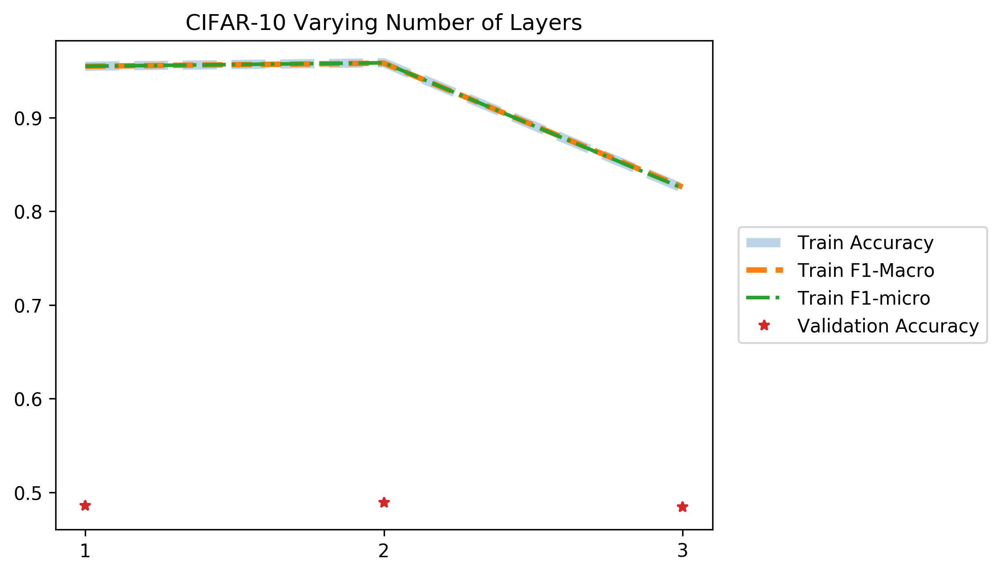

In [150]:
display(Image('CIFAR-10 Varying Number of Layers.png', width=672, height=378))

<h3>Task 2 (Varying Number of Units in Each Layer)</h3>

In [0]:
experiment('CIFAR-10',X=[512,1024,2048,4096,8192],typ=1,VAR=[[512,],[1024,],[2048,],[4096,],[8192]],title='Varying Number of Units $1^{st}$ Layer')

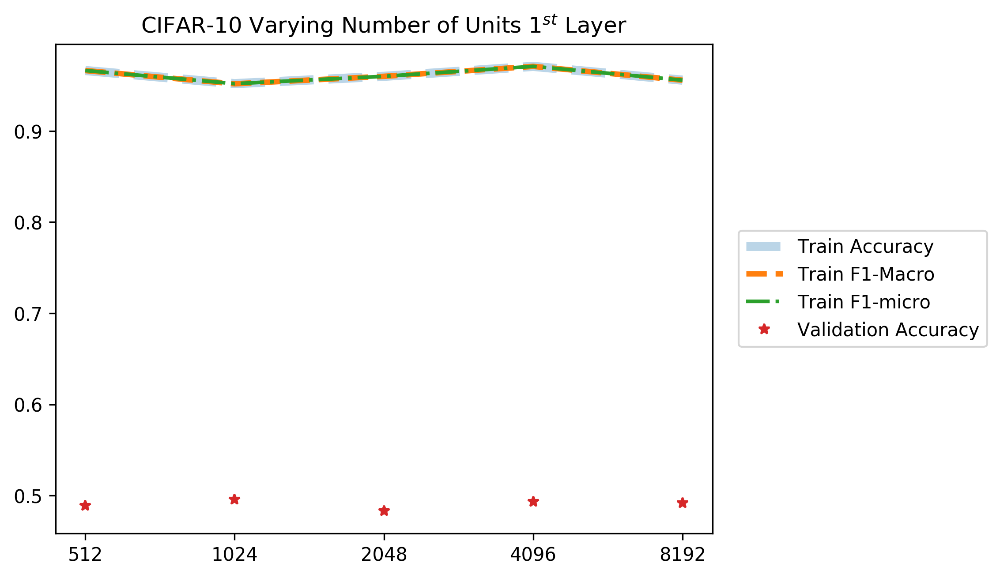

In [151]:
display(Image('CIFAR-10 Varying Number of Units $1^{st}$ Layer.png', width=672, height=378))

In [0]:
experiment('CIFAR-10',X=[512,1024,2048,4096,8192],typ=1,VAR=[[4096,512,],[4096,1024,],[4096,2048,],[4096,4096],[4096,8192,]],title='Varying Number of Units $2^{nd}$ Layer')

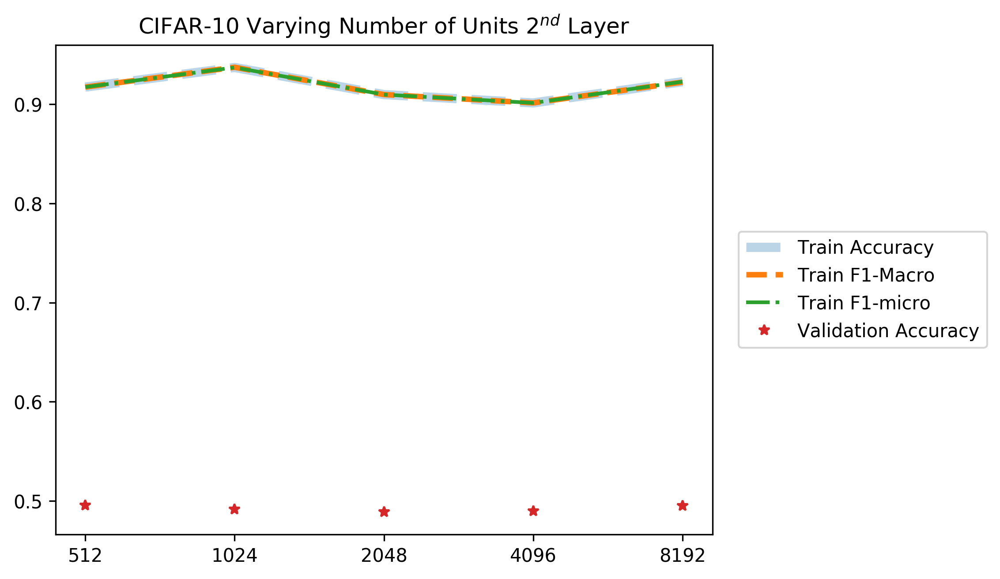

In [153]:
display(Image('CIFAR-10 Varying Number of Units $2^{nd}$ Layer.png', width=672, height=378))

In [0]:
experiment('CIFAR-10',X=[512,1024,2048,4096],typ=1,VAR=[[4096,4096,512],[4096,4096,1024],[4096,4096,2048],[4096,4096,4096]],title='Varying Number of Units $3^{rd}$ Layer')

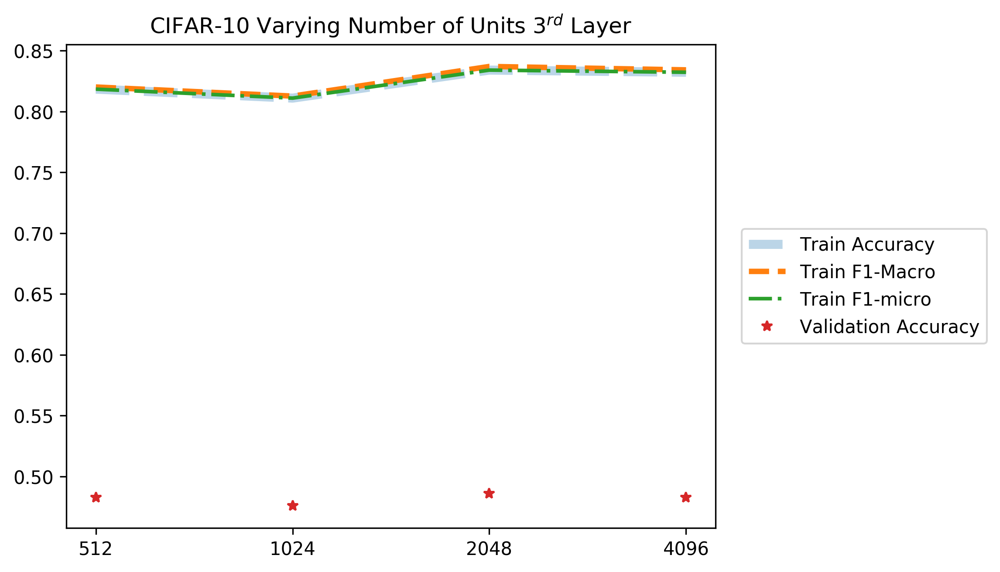

In [154]:
display(Image('CIFAR-10 Varying Number of Units $3^{rd}$ Layer.png', width=672, height=378))

<h3>Task 3 (Varying Activation Functions)</h3>

In [0]:
experiment('CIFAR-10',X=['sigmoid','tanh','relu','swish'],typ=2,VAR=['sigmoid','tanh','relu','swish'],title='Varying Activation Functions')

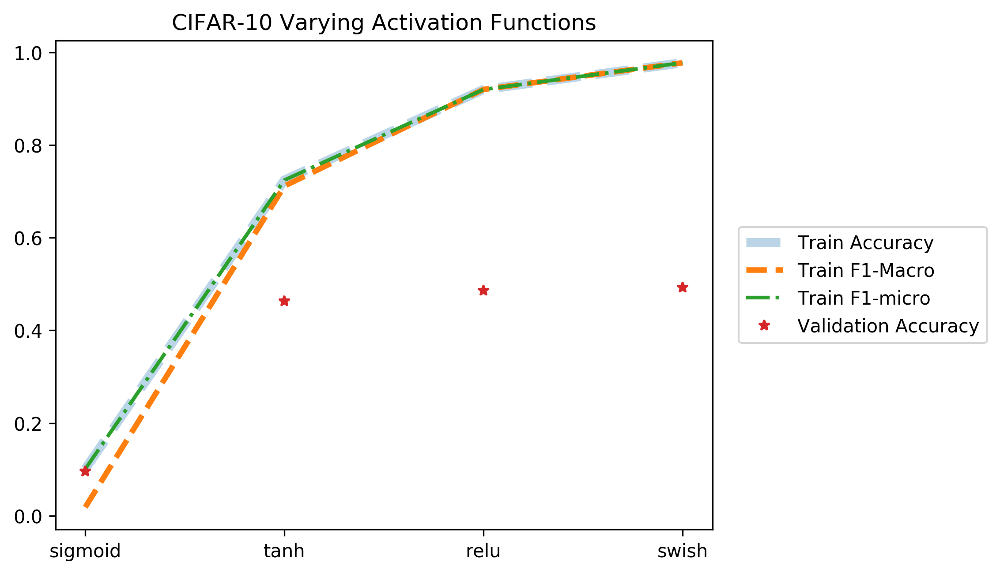

In [155]:
display(Image('CIFAR-10 Varying Activation Functions.png', width=672, height=378))

<h3>Task 4 (Changing Initialization Techniques)</h3><br>
<b>Note :</b> Almost No Change of Initialization Technique is Observed

In [0]:
for tech in ['uniform','normal','glorot_uniform','glorot_normal']:
  init_try('CIFAR-10',tech)

<h4>Uniform Initialization</h4>
<pre>
Training Accuracy on CIFAR-10 is 0.9156
Training F1-Macro on CIFAR-10 is 0.9150
Training F1-micro on CIFAR-10 is 0.9156
Validation Accuracy on CIFAR-10 is 0.4852
</pre>
<h4>Normal Initialization</h4>
<pre>
Training Accuracy on CIFAR-10 is 0.9093
Training F1-Macro on CIFAR-10 is 0.9089
Training F1-micro on CIFAR-10 is 0.9093
Validation Accuracy on CIFAR-10 is 0.4748
</pre>
<h4>Glorot Uniform Initialization</h4>
<pre>
Training Accuracy on CIFAR-10 is 0.9071
Training F1-Macro on CIFAR-10 is 0.9067
Training F1-micro on CIFAR-10 is 0.9071
Validation Accuracy on CIFAR-10 is 0.4959
</pre>
<h4>Glorot Normal Initialization</h4>
<pre>
Training Accuracy on CIFAR-10 is 0.9151
Training F1-Macro on CIFAR-10 is 0.9147
Training F1-micro on CIFAR-10 is 0.9151
Validation Accuracy on CIFAR-10 is 0.4882
</pre>




<h3>Task 5 & 6 (Clustering & t-SNE plots for varying data amount)</h3>

In [0]:
VectorialClusterTSNE('CIFAR-10')

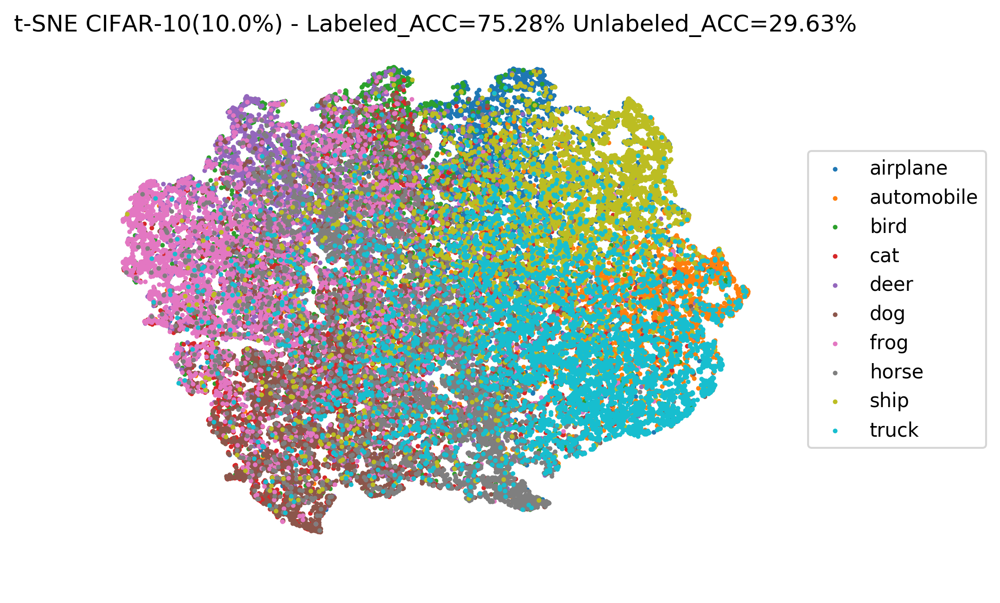

In [156]:
display(Image('t-SNE CIFAR-10(10.0%).png', width=672, height=378))

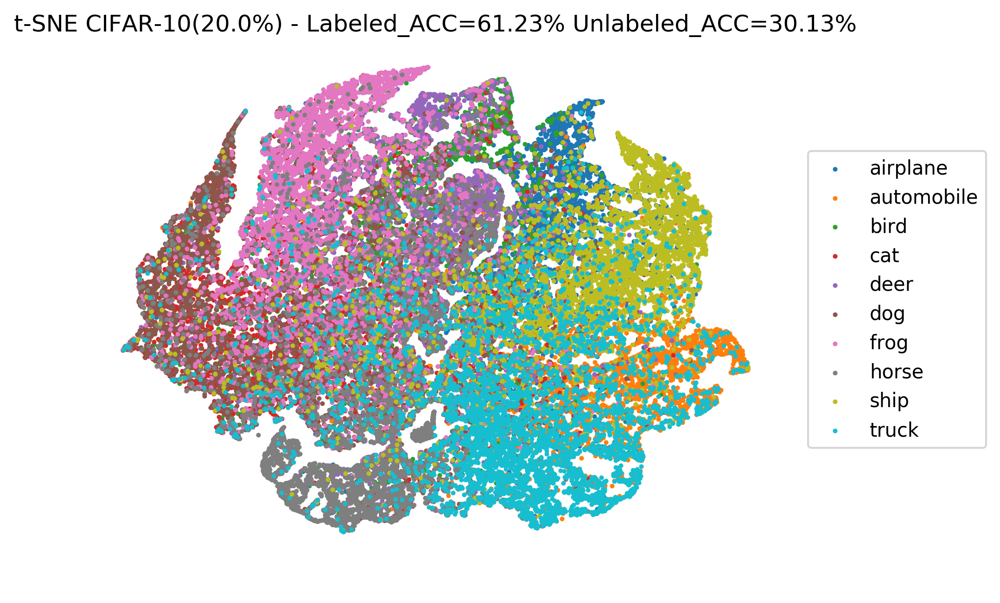

In [157]:
display(Image('t-SNE CIFAR-10(20.0%).png', width=672, height=378))

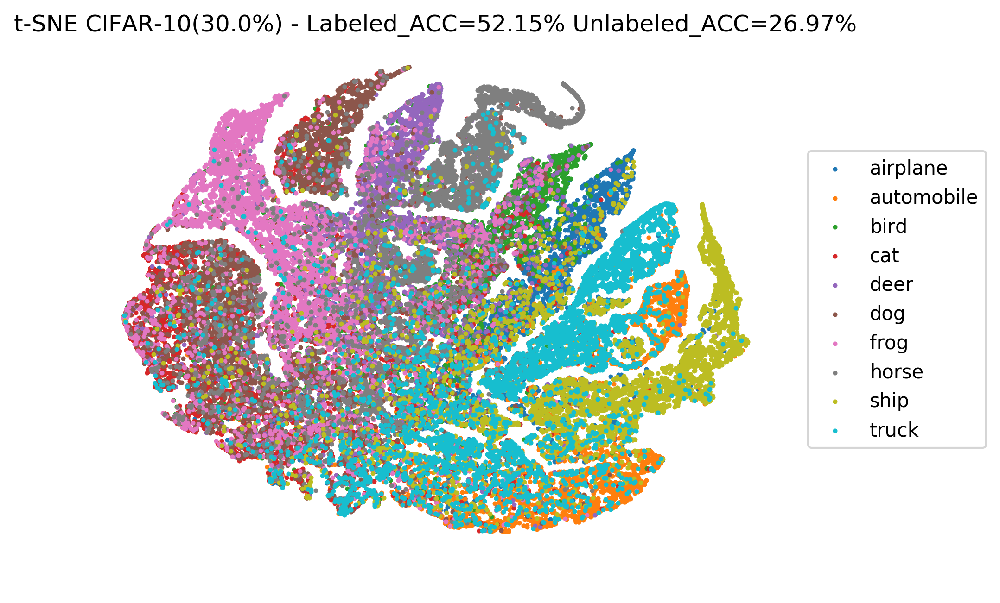

In [158]:
display(Image('t-SNE CIFAR-10(30.0%).png', width=672, height=378))

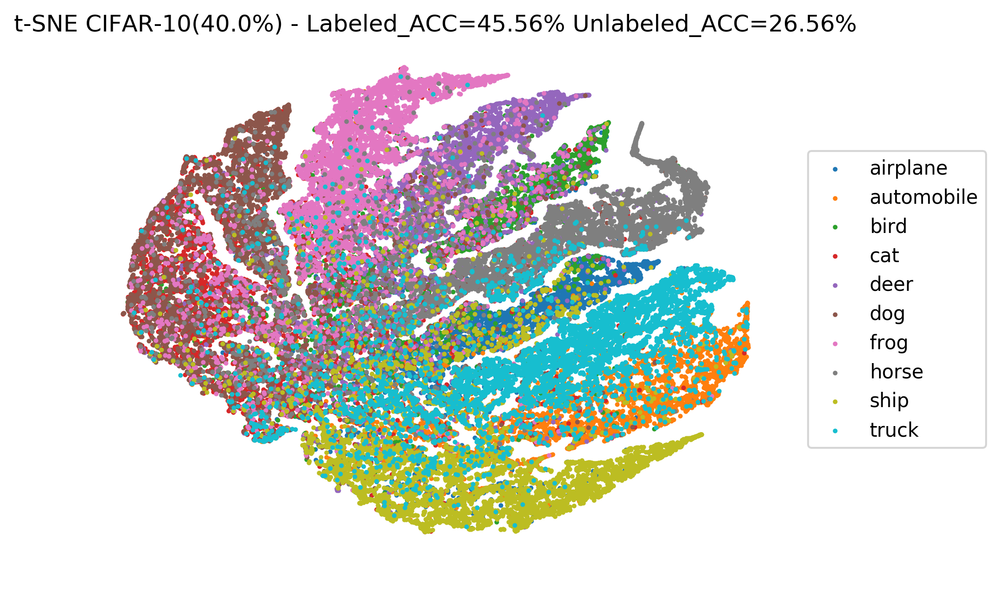

In [159]:
display(Image('t-SNE CIFAR-10(40.0%).png', width=672, height=378))

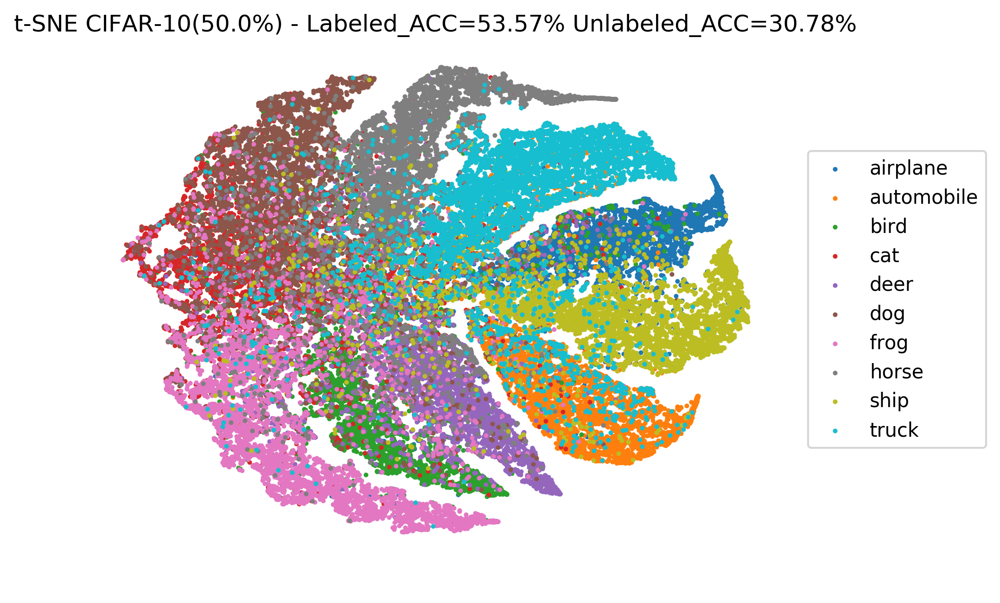

In [160]:
display(Image('t-SNE CIFAR-10(50.0%).png', width=672, height=378))

<h3>Task 7 (MLP Results on CIFAR-10)</h3>

In [0]:
MLP('CIFAR-10')

<pre>
MLP Accuracy on CIFAR-10 is 0.9218
MLP F1-Macro on CIFAR-10 is 0.9215
MLP F1-micro on CIFAR-10 is 0.9218
</pre>

<br><br>
<h1>Experimentation Section for Fashion-MNIST</h1>

<h3>Task 1 (Varying Number of Layers)</h3>

In [0]:
experiment('Fashion-MNIST',X=[1,2,3],typ=1,VAR=[[4096],[4096],[4096,4096,1024]],title='Varying Number of Layers')

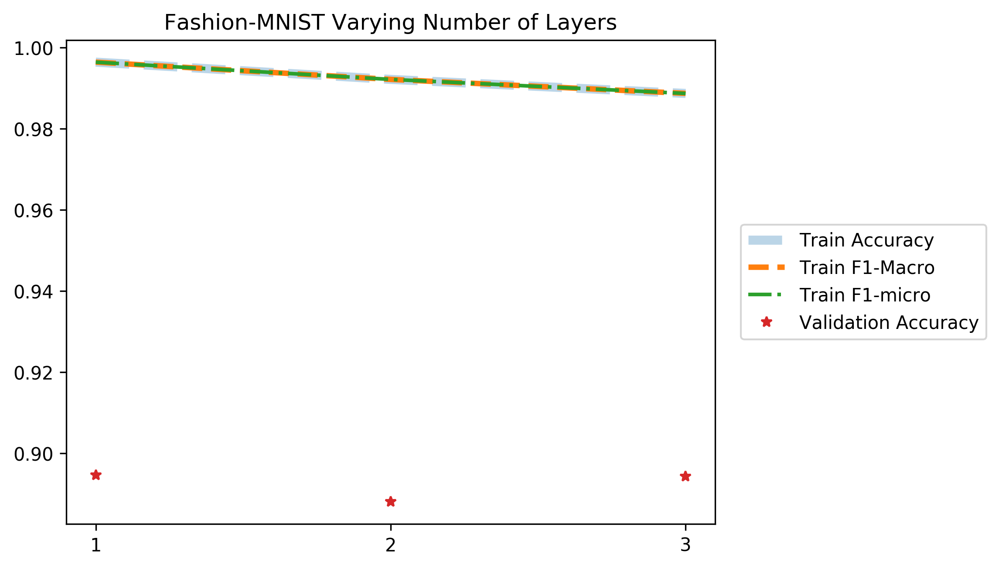

In [161]:
display(Image('Fashion-MNIST Varying Number of Layers.png', width=672, height=378))

<h3>Task 2 (Varying Number of Units in Each Layer)</h3>

In [0]:
experiment('Fashion-MNIST',X=[512,1024,2048,4096,8192],typ=1,VAR=[[512,],[1024,],[2048,],[4096,],[8192]],title='Varying Number of Units $1^{st}$ Layer')

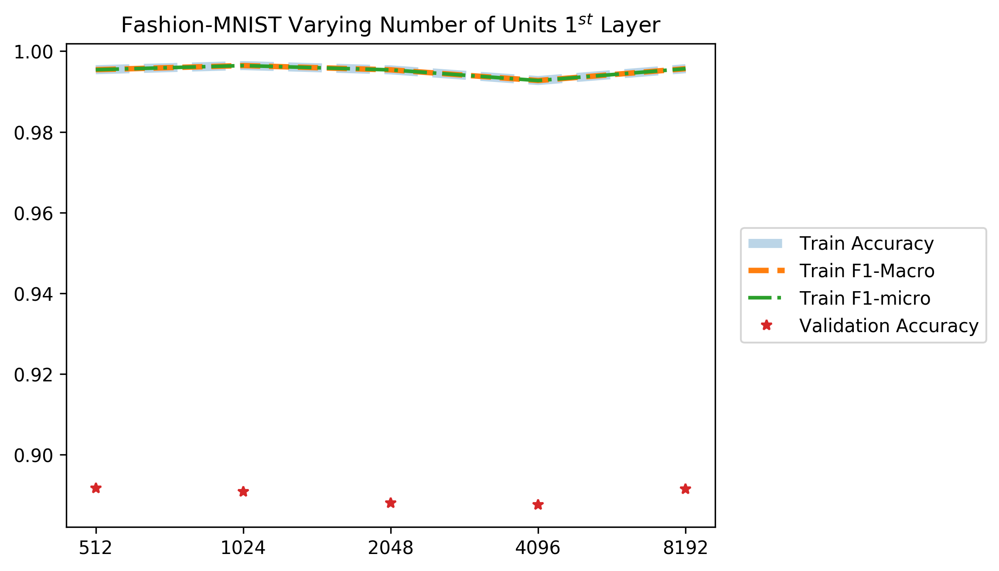

In [162]:
display(Image('Fashion-MNIST Varying Number of Units $1^{st}$ Layer.png', width=672, height=378))

In [0]:
experiment('Fashion-MNIST',X=[512,1024,2048,4096,8192],typ=1,VAR=[[4096,512,],[4096,1024,],[4096,2048,],[4096,4096],[4096,8192,]],title='Varying Number of Units $2^{nd}$ Layer')

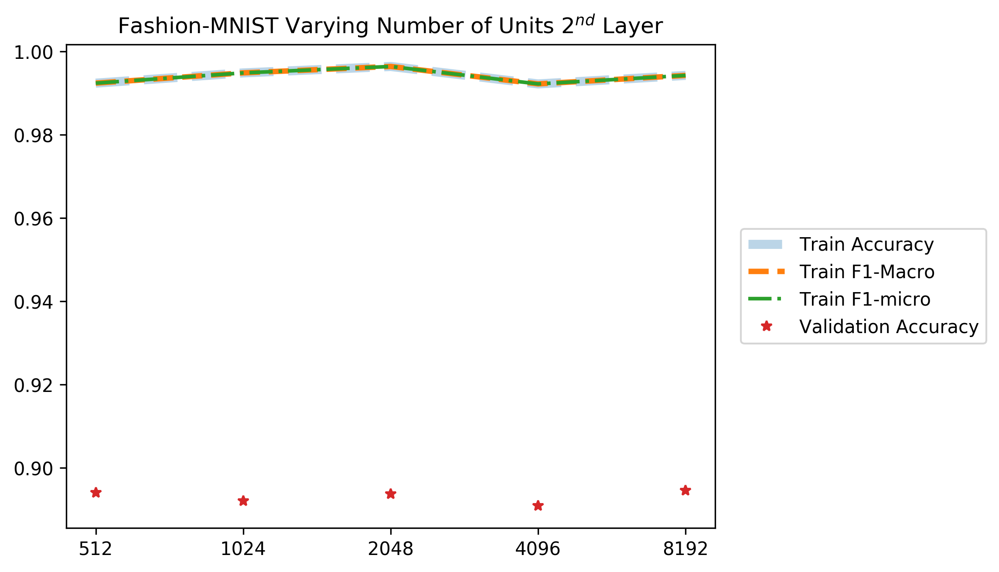

In [163]:
display(Image('Fashion-MNIST Varying Number of Units $2^{nd}$ Layer.png', width=672, height=378))

In [0]:
experiment('Fashion-MNIST',X=[512,1024,2048,4096],typ=1,VAR=[[4096,4096,512],[4096,4096,1024],[4096,4096,2048],[4096,4096,4096]],title='Varying Number of Units $3^{rd}$ Layer')

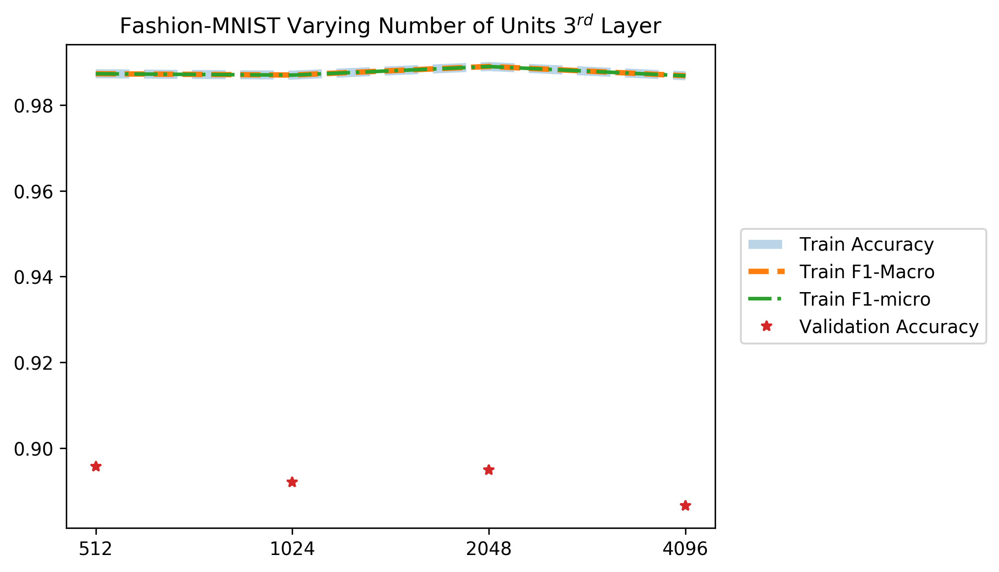

In [164]:
display(Image('Fashion-MNIST Varying Number of Units $3^{rd}$ Layer.png', width=672, height=378))

<h3>Task 3 (Varying Activation Functions)</h3>

In [0]:
experiment('Fashion-MNIST',X=['sigmoid','tanh','relu','swish'],typ=2,VAR=['sigmoid','tanh','relu','swish'],title='Varying Activation Functions')

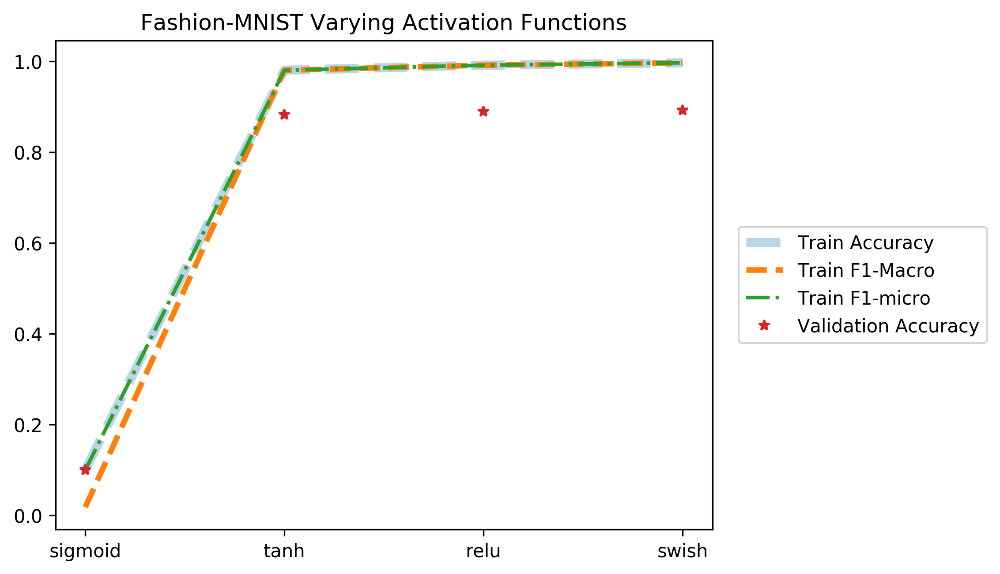

In [165]:
display(Image('Fashion-MNIST Varying Activation Functions.png', width=672, height=378))

<h3>Task 4 (Changing Initialization Techniques)</h3><br>
<b>Note :</b> Almost No Change of Initialization Technique is Observed

In [0]:
for tech in ['uniform','normal','glorot_uniform','glorot_normal']:
  init_try('Fashion-MNIST',tech)

<h4>Uniform Initialization</h4>
<pre>
Training Accuracy on Fashion-MNIST is 0.9911
Training F1-Macro on Fashion-MNIST is 0.9911
Training F1-micro on Fashion-MNIST is 0.9911
Validation Accuracy on Fashion-MNIST is 0.8892
</pre>
<h4>Normal Initialization</h4>
<pre>
Training Accuracy on Fashion-MNIST is 0.9958
Training F1-Macro on Fashion-MNIST is 0.9958
Training F1-micro on Fashion-MNIST is 0.9958
Validation Accuracy on Fashion-MNIST is 0.8873
</pre>
<h4>Glorot Uniform Initialization</h4>
<pre>
Training Accuracy on Fashion-MNIST is 0.9909
Training F1-Macro on Fashion-MNIST is 0.9909
Training F1-micro on Fashion-MNIST is 0.9909
Validation Accuracy on Fashion-MNIST is 0.8903
</pre>
<h4>Glorot Normal Initialization</h4>
<pre>
Training Accuracy on Fashion-MNIST is 0.9966
Training F1-Macro on Fashion-MNIST is 0.9966
Training F1-micro on Fashion-MNIST is 0.9966
Validation Accuracy on Fashion-MNIST is 0.8930
</pre>




<h3>Task 5 & 6 (Clustering & t-SNE plots for varying data amount)</h3>

In [0]:
VectorialClusterTSNE('Fashion-MNIST')

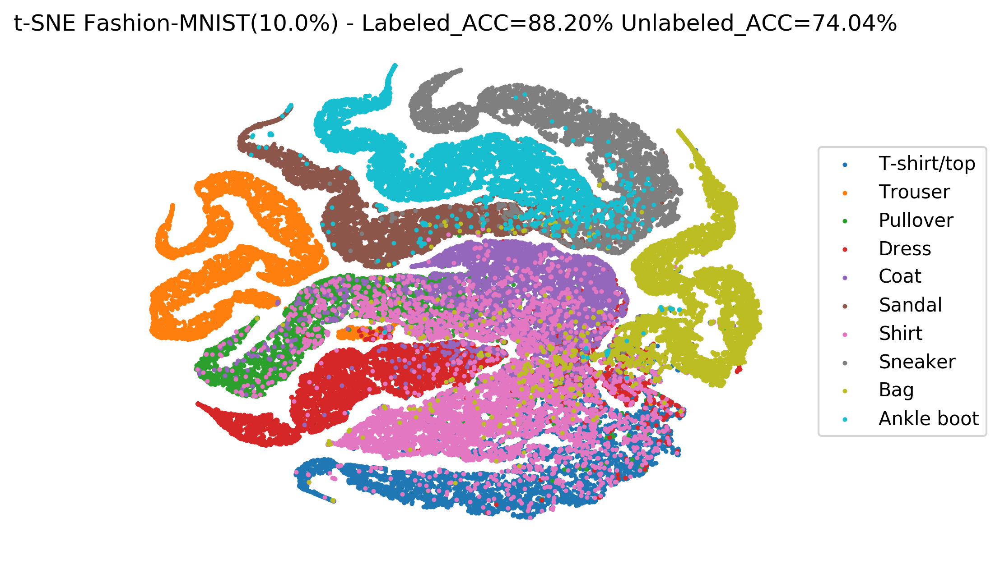

In [166]:
display(Image('t-SNE Fashion-MNIST(10.0%).png', width=672, height=378))

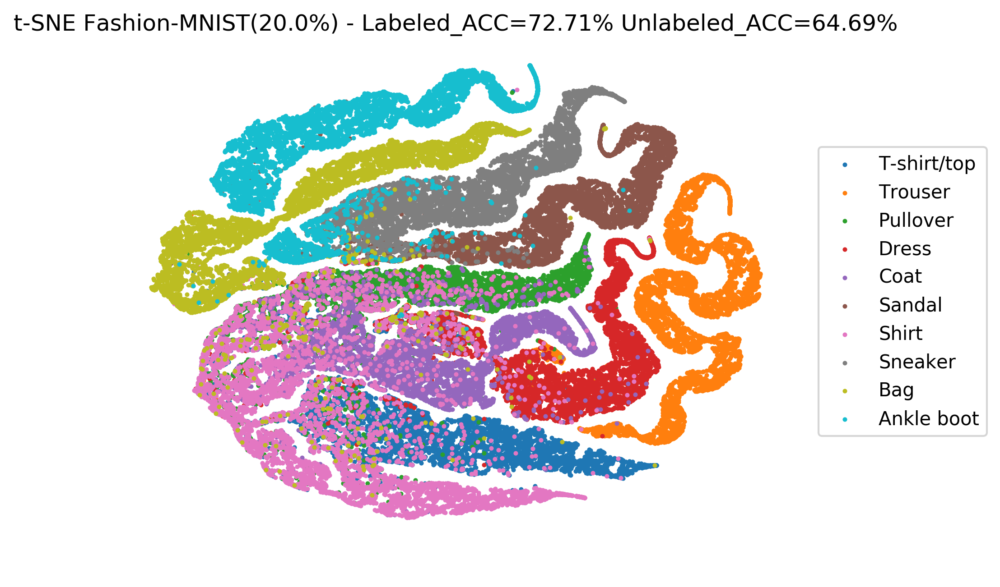

In [149]:
display(Image('t-SNE Fashion-MNIST(20.0%).png', width=672, height=378))

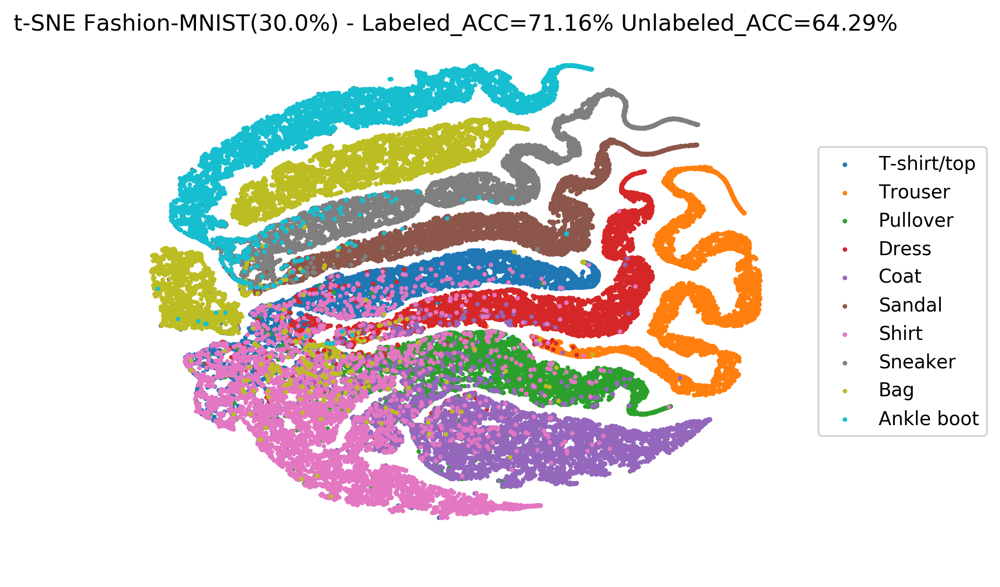

In [167]:
display(Image('t-SNE Fashion-MNIST(30.0%).png', width=672, height=378))

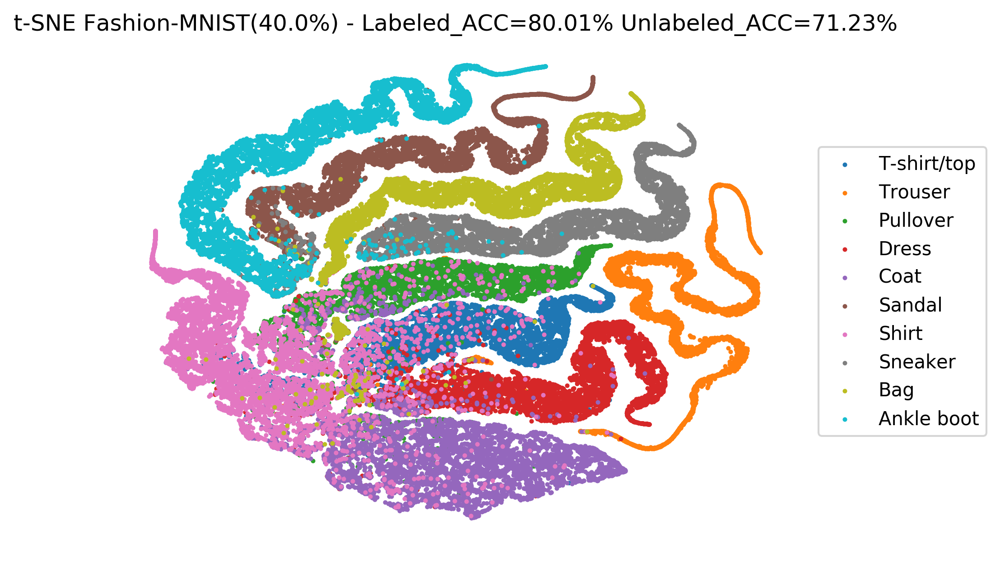

In [168]:
display(Image('t-SNE Fashion-MNIST(40.0%).png', width=672, height=378))

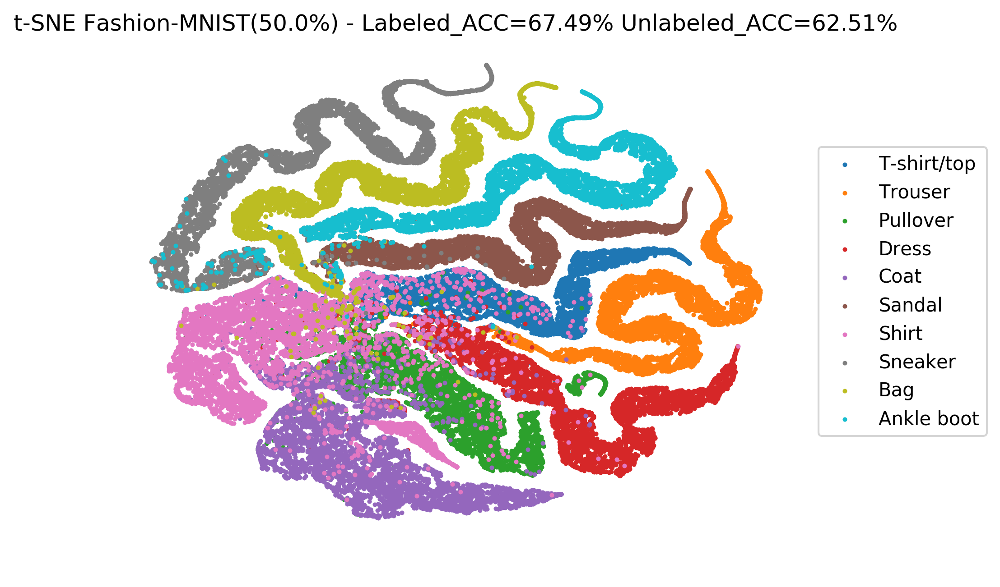

In [169]:
display(Image('t-SNE Fashion-MNIST(50.0%).png', width=672, height=378))

<h3>Task 7 (MLP Results on Fashion-MNIST)</h3>

In [0]:
MLP('Fashion-MNIST')

<pre>
MLP Accuracy on Fashion-MNIST is 0.9958
MLP F1-Macro on Fashion-MNIST is 0.9958
MLP F1-micro on Fashion-MNIST is 0.9958
</pre>

<br><br><br><br><br><br><br><br>
<h1>Simulating Command Line on "Google Colab"</h1>

In [0]:
try:
  datasets
except:
  datasets = {}
else:
  datasets = {}

In [0]:
def add_dataset(data_path,name='dataset_name',test=0):
  if name=='CIFAR-10':
    X,Y,target_names = None, None, None
    for file_name in os.listdir(data_path):
      if ('test_batch' if test==1 else 'data_batch') in file_name:
        temp = unpickle( os.path.join(data_path,file_name) )
        X = pd.concat( (pd.DataFrame(temp[b'data']),  X) ) if X is not None else pd.DataFrame( temp[b'data']   )
        Y = pd.concat( (pd.DataFrame(temp[b'labels']),Y) ) if Y is not None else pd.DataFrame( temp[b'labels'] )
      elif 'batches' in file_name:
        temp = unpickle( '/'.join((data_path,file_name)) )
        target_names = temp[b'label_names']
      
    X = np.array( [np.array(x).reshape((32,32,3)) for i,x in X.iterrows()] )
    Y = np.array( Y )
    datasets['CIFAR-10'] = (X,Y,[x.decode('ascii') for x in target_names])
    
  elif name=='Fashion-MNIST':
    X, Y = map(pd.DataFrame,load_mnist(data_path, kind='t10k')) if test==1 else map(pd.DataFrame,load_mnist(data_path, kind='train'))
    X = np.array( [np.array([np.array(x).reshape((28,28)),np.array(x).reshape((28,28)),np.array(x).reshape((28,28))]) for i,x in X.iterrows()] )
    Y = np.array( Y )
    datasets['Fashion-MNIST'] = (np.array([np.array(x).reshape((28,28,3)) for x in X]), np.array(Y), ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot'])

In [0]:
# argv = list(sys.argv)

# argv = ['main.py','--train-data','data/Fashion-MNIST','--test-data','data/Fashion-MNIST','--activation','relu','--dataset','Fashion-MNIST','--configuration','[4096','4096]']
# argv = ['main.py','--test-data','data/Fashion-MNIST','--activation','relu','--dataset','Fashion-MNIST']

# argv = ['main.py','--train-data','data/CIFAR-10','--test-data','data/CIFAR-10','--activation','relu','--dataset','CIFAR-10','--configuration','[4096','4096]']
# argv = ['main.py','--test-data','data/CIFAR-10','--activation','relu','--dataset','CIFAR-10']

name = argv[argv.index('--dataset')+1]
if '--train-data' in argv:
  save_dir = os.path.join(os.getcwd(),'saved_models') # Remove Later
  model_path = os.path.join(save_dir, name)           # Remove Later
  activation = argv[argv.index('--activation')+1] if '--activation' in argv else 'relu'
  train_path = argv[argv.index('--train-data')+1]
  config   = []
  for st in argv[argv.index('--configuration')+1:]:
    st  = st.strip()
    if st.endswith(']'):
      config.append(int(st.strip('[]')))
      break
    else:
      config.append(int(st.strip('[]')))
  add_dataset(data_path=train_path,name=name,test=0)
  cnn,res = wrapper(name,'standard',config,activation,'glorot_normal',50,300,'Adam',ext=False)
  cnn.save_model()                                    # Remove Later
else:
  save_dir = os.path.join(os.getcwd(),'saved_models')
  model_path = os.path.join(save_dir, name)
  cnn = CNN(name)
  cnn.load_model()

test_path = argv[argv.index('--test-data')+1]
add_dataset(data_path=test_path,name=name,test=1)
cnn.data_feed(*datasets[name])
cnn.data_preprocess('standard')
num_classes = 10 # len(set(np.ravel(datasets[name][1])))
cnn.labels  = tensorflow.keras.utils.to_categorical(cnn.labels, num_classes)
cnn.vlabels = tensorflow.keras.utils.to_categorical(cnn.vlabels, num_classes)

_ = cnn.evaluate(cnn.data,cnn.labels)
print('Test Accuracy :: {0:.2f}'.format(round(_[0]*100,2)))
print('Test Macro-F1 Score :: {0:.2f}'.format(round(_[1]*100,2)))
print('Test Micro-F1 Score :: {0:.2f}'.format(round(_[2]*100,2)))